# **Improving Location-Based Models**

---


## 📖 1. **Introduction**


During this semester, our project focused on predicting weather conditions in various cities across the world.

Early in our process, we noticed that location was treated as a simple one-hot encoded categorical feature, which raised the question: *Could we find a better way to represent spatial information—and would that lead to improved predictions?*

This curiosity led us to choose to explore more advanced spatial encoding techniques, with the goal of enriching our model’s understanding of location beyond basic city labels.

---

### 🔄 Workflow


####🛠️ Step 1: Baseline Approaches

We started by applying **basic encoding techniques** to handle location data, including:

- **One-Hot Encoding**: Each city was converted into a separate binary feature.
- **Label Encoding**: Each city was assigned a unique numeric code.

These approaches allowed the model to use location as a feature, but they **treated cities as isolated categories**—with no sense of how geographically close or far apart they were. As a result, the model had **no spatial awareness** and couldn’t capture important geographic patterns, such as neighboring cities sharing similar weather conditions.

---


#### 🔎 Step 2: Searching for Improved Spatial Representations

To address this limitation, we began searching for techniques that could capture **actual geographic relationships** between locations, rather than treating them as purely independent categories.

This search led us to **Geohash**, a popular encoding method that converts **latitude and longitude** into a **compact, hierarchical string**. Geohashes are designed to preserve spatial proximity—meaning nearby locations share common prefixes. This made **Geohash** our first advanced spatial encoding attempt.

---


#### 🌐 Step 3: Expanding to 3D Geospatial Encoding

After experimenting with Geohash, we realized that **2D spatial encoding**—based only on latitude and longitude—might still miss important information. Specifically, **elevation** (altitude) plays a critical role in weather patterns, affecting variables such as temperature and air pressure.

This motivated us to explore **3D Geospatial Encoding**, which enhances the spatial representation by adding **elevation** as a third dimension. This richer, three-dimensional representation gave our model a more complete view of the spatial context for each observation, helping it better understand the physical environment that influences weather conditions.

### Set Data Folder and Import Libraries

In [ ]:
data_folder = './Final_Project/data'  # Path relative to the "WeatherDataScience" repo root. Change if needed.

In [ ]:
!pip uninstall geohash2 -y
!pip install python-geohash

In [ ]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import geohash

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_extraction import FeatureHasher
from sklearn.preprocessing import LabelEncoder

# Geopy
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut, GeocoderServiceError

# Visualization (3D and animations)
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Sparse matrices
from scipy.sparse import hstack, csr_matrix

# Progress bar
from tqdm import tqdm

import requests
import json


### Load Dataset and Describe

The weather dataset includes geographic features (latitude, longitude) alongside weather variables (temperature, wind speed, pressure) and air quality indicators. These will help us predict precipitation.

In [ ]:
weather = pd.read_csv(os.path.join(data_folder, 'GlobalWeatherRepository.csv'))
weather.head()

,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45,23.0,73.4,Sunny,...,10.4,18.4,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55
3,Andorra,Andorra La Vella,42.50,1.52,Europe/Andorra,1715849100,2024-05-16 10:45,6.3,43.3,Light drizzle,...,0.7,0.9,1,1,06:31 AM,09:11 PM,02:12 PM,03:31 AM,Waxing Gibbous,55
4,Angola,Luanda,-8.84,13.23,Africa/Luanda,1715849100,2024-05-16 09:45,26.0,78.8,Partly cloudy,...,183.4,262.3,5,10,06:12 AM,05:55 PM,01:17 PM,12:38 AM,Waxing Gibbous,55


London Houses dataset includes property features along with location-based attributes (Address, Neighborhood). We will predict the price of the houses (Price (£)).

In [ ]:
london_houses = pd.read_csv(os.path.join(data_folder, 'london_houses.csv'))
london_houses.head()

,Address,Neighborhood,Bedrooms,Bathrooms,Square Meters,Building Age,Garden,Garage,Floors,Property Type,Heating Type,Balcony,Interior Style,View,Materials,Building Status,Price (£)
0,78 Regent Street,Notting Hill,2,3,179,72,No,No,3,Semi-Detached,Electric Heating,High-level Balcony,Industrial,Garden,Marble,Renovated,2291200
1,198 Oxford Street,Westminster,2,1,123,34,Yes,No,1,Apartment,Central Heating,High-level Balcony,Industrial,City,Laminate Flooring,Old,1476000
2,18 Regent Street,Soho,5,3,168,38,No,Yes,3,Semi-Detached,Central Heating,No Balcony,Industrial,Street,Wood,Renovated,1881600
3,39 Piccadilly Circus,Islington,5,1,237,53,Yes,Yes,1,Apartment,Underfloor Heating,No Balcony,Classic,Park,Granite,Renovated,1896000
4,116 Fleet Street,Marylebone,4,1,127,23,No,Yes,2,Semi-Detached,Central Heating,No Balcony,Modern,Park,Wood,Old,1524000


Israel Bagrut dataset includes location-based features such as City and School along with with grades, subjects and year. We will predict the grade.

In [ ]:
israel_bagrut = pd.read_csv(os.path.join(data_folder, 'israel_bagrut_averages.csv'))
israel_bagrut.head()

,grade,takers,studyunits,year,subject,city,school,semel
0,74.47,83,2,2013,אזרחות,אבו גוש,מקיף אבו גוש,148080
1,74.22,78,2,2014,אזרחות,אבו גוש,מקיף אבו גוש,148080
2,70.39,59,2,2015,אזרחות,אבו גוש,מקיף אבו גוש,148080
3,82.83,60,2,2016,אזרחות,אבו גוש,מקיף אבו גוש,148080
4,65.81,32,3,2013,אנגלית,אבו גוש,מקיף אבו גוש,148080


Cost_of_Living dataset includes location-based features such as City and Country, which allow for geographic analysis of economic factors influencing salaries. By incorporating these features we will predict the average monthly salary.

In [ ]:
cost_of_living = pd.read_csv(os.path.join(data_folder, "cost-of-living_v2.csv"))
cost_of_living.head()

,city,country,x1,x2,x3,x4,x5,x6,x7,x8,...,x47,x48,x49,x50,x51,x52,x53,x54,x55,data_quality
0,Seoul,South Korea,7.68,53.78,6.15,3.07,4.99,3.93,1.48,0.79,...,110.36,742.54,557.52,2669.12,1731.08,22067.70,10971.90,2689.62,3.47,1
1,Shanghai,China,5.69,39.86,5.69,1.14,4.27,3.98,0.53,0.33,...,123.51,1091.93,569.88,2952.70,1561.59,17746.11,9416.35,1419.87,5.03,1
2,Guangzhou,China,4.13,28.47,4.98,0.85,1.71,3.54,0.44,0.33,...,43.89,533.28,317.45,1242.24,688.05,12892.82,5427.45,1211.68,5.19,1
3,Mumbai,India,3.68,18.42,3.68,2.46,4.30,2.48,0.48,0.19,...,41.17,522.40,294.05,1411.12,699.80,6092.45,2777.51,640.81,7.96,1
4,Delhi,India,4.91,22.11,4.30,1.84,3.68,1.77,0.49,0.19,...,36.50,229.84,135.31,601.02,329.15,2506.73,1036.74,586.46,8.06,1


### Data Cleaning and Preprocessing

We will start with cleaning, encoding, and transforming data for analysis.

In [ ]:
# Drop unnecessary columns
cols_to_remove = [
    "timezone", "last_updated", "wind_direction",
    "temperature_fahrenheit", "wind_mph", "pressure_in",
    "precip_in", "feels_like_fahrenheit", "visibility_miles", "gust_mph"
]
weather.drop(columns=cols_to_remove, inplace=True)

# One-hot encode categorical columns: 'country', 'location_name', 'condition_text', 'moon_phase'
weather = pd.get_dummies(weather, columns=["country", "location_name", "condition_text", "moon_phase"],
                         prefix=["country", "location", "condition", "moon_phase"])

# Convert time-related columns (sunrise, sunset, moonrise, moonset) to numerical values
def time_to_seconds(time_str):
    t = pd.to_datetime(time_str, format="%I:%M %p", errors="coerce")
    return None if pd.isnull(t) else t.hour * 3600 + t.minute * 60

for col in ["sunrise", "sunset", "moonrise", "moonset"]:
    weather[col] = weather[col].apply(time_to_seconds)

In [ ]:
# 1. Drop the 'Address' column
# london_houses.drop('Address', axis=1, inplace=True)

# 2. Map binary columns: 'Garden' and 'Garage'
binary_mapping = {"No": 0, "Yes": 1}
london_houses['Garden'] = london_houses['Garden'].map(binary_mapping)
london_houses['Garage'] = london_houses['Garage'].map(binary_mapping)

# 3. Map 'Balcony' values: 0 - No Balcony, 1 - High-level Balcony, 2 - Low-level Balcony
balcony_mapping = {
    "No Balcony": 0,
    "High-level Balcony": 1,
    "Low-level Balcony": 2
}
london_houses['Balcony'] = london_houses['Balcony'].map(balcony_mapping)

# 4. Map 'Building Status' values: 0 - Old, 1 - Renovated, 2 - New
building_status_mapping = {
    "Old": 0,
    "Renovated": 1,
    "New": 2
}
london_houses['Building Status'] = london_houses['Building Status'].map(building_status_mapping)

# 5. One-hot encode the categorical columns
one_hot_columns = ['Neighborhood', 'Property Type', 'Heating Type', 'Interior Style', 'View', 'Materials']
london_houses = pd.get_dummies(london_houses, columns=one_hot_columns)

In [ ]:
# 1. Map 'subject' to integer labels using factorize
israel_bagrut['subject'] = pd.factorize(israel_bagrut['subject'])[0]

# 2. One-hot encode 'city'
israel_bagrut = pd.get_dummies(israel_bagrut, columns=['city'])

# 3. Map 'school' to integer labels using factorize
israel_bagrut['school'] = pd.factorize(israel_bagrut['school'])[0]

target_col = 'grade'
israel_bagrut = israel_bagrut.dropna(subset=[target_col])

In [ ]:
# Step 1: Remove rows where x54 is NaN (modify original dataset)
cost_of_living = cost_of_living.dropna(subset=['x54'])

# Step 2: Fill NaN values in other columns with the column mean (modify original dataset)
cost_of_living.fillna(cost_of_living.mean(numeric_only=True), inplace=True)

<ipython-input-21-1202d2e9588a>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cost_of_living.fillna(cost_of_living.mean(numeric_only=True), inplace=True)


## 🏁 2. **Baseline Approaches**

First, we will present two baseline approaches—one-hot encoding and label encoding—and later we will compare them to more advanced techniques.

### 2.1 One-Hot Vector Encoding

🔹 **One-Hot Encoding Solution**  

**Goal**  
Train a regression model using **One-Hot Encoding** for location data and evaluate its effectiveness.  

**Steps**  
1️⃣ Convert categorical location features (e.g., cities, neighborhoods) into **binary variables**.  
2️⃣ Train a regression model using the **one-hot encoded** location features.  
3️⃣ calculate performance metrics


In [ ]:
# Create a copy to work on
weather_hot_vect = weather.copy()

# Define the target variable
weather_target_hot_vect = "precip_mm"

# Create feature matrix (X) and target vector (y)
weather_X_hot_vect = weather_hot_vect.drop(columns=[weather_target_hot_vect], errors="ignore")
weather_X_hot_vect = weather_X_hot_vect.drop(columns=["latitude", "longitude"], errors="ignore")
weather_y_hot_vect = weather_hot_vect[weather_target_hot_vect]

# Handle missing values
imputer_hot_vect = SimpleImputer(strategy="most_frequent")
weather_X_imputed_hot_vect = imputer_hot_vect.fit_transform(weather_X_hot_vect)
weather_X_hot_vect = pd.DataFrame(weather_X_imputed_hot_vect, columns=weather_X_hot_vect.columns)

# Standardize numerical data
scaler_hot_vect = StandardScaler()
weather_X_scaled_hot_vect = scaler_hot_vect.fit_transform(weather_X_hot_vect)
weather_X_hot_vect = pd.DataFrame(weather_X_scaled_hot_vect, columns=weather_X_hot_vect.columns)

# Split data into training and testing sets
weather_X_train_hot_vect, weather_X_test_hot_vect, weather_y_train_hot_vect, weather_y_test_hot_vect = train_test_split(
    weather_X_hot_vect, weather_y_hot_vect, test_size=0.2, random_state=42
)

# Train a linear regression model
weather_model_hot_vect = LinearRegression()
weather_model_hot_vect.fit(weather_X_train_hot_vect, weather_y_train_hot_vect)

# Make predictions
weather_y_pred_hot_vect = weather_model_hot_vect.predict(weather_X_test_hot_vect)

# Evaluate the model
weather_r2_hot_vect = r2_score(weather_y_test_hot_vect, weather_y_pred_hot_vect)
weather_mse_hot_vect = mean_squared_error(weather_y_test_hot_vect, weather_y_pred_hot_vect)
weather_mae_hot_vect = mean_absolute_error(weather_y_test_hot_vect, weather_y_pred_hot_vect)
weather_rmse_hot_vect = np.sqrt(weather_mse_hot_vect)


print("\nModel Evaluation:")
print("R-squared:", weather_r2_hot_vect)
print("Mean Squared Error:", weather_mse_hot_vect)
print("Mean Absolute Error:", weather_mae_hot_vect)
print("RMSE:", weather_rmse_hot_vect)


Model Evaluation:
R-squared: 0.20926853795300493
Mean Squared Error: 0.21531881744997042
Mean Absolute Error: 0.1791609030299911
RMSE: 0.46402458711793537


In [ ]:
# Create a copy to work on
london_houses_hot_vect = london_houses.copy()
london_houses_hot_vect.drop('Address', axis=1, inplace=True)


# Separate features and target variable.
# Assuming 'Price (£)' is the target.
london_house_X_hot_vect = london_houses_hot_vect.drop('Price (£)', axis=1)
london_house_y_hot_vect = london_houses_hot_vect['Price (£)']

# Split the data into training and test sets.
london_house_X_train_hot_vect, london_house_X_test_hot_vect, london_house_y_train_hot_vect, london_house_y_test_hot_vect = train_test_split(
    london_house_X_hot_vect, london_house_y_hot_vect, test_size=0.2, random_state=42
)

# Create and fit the linear regression model.
london_house_model_hot_vect = LinearRegression()
london_house_model_hot_vect.fit(london_house_X_train_hot_vect, london_house_y_train_hot_vect)

# Predict on the test set.
london_house_y_pred_hot_vect = london_house_model_hot_vect.predict(london_house_X_test_hot_vect)

# Evaluate the model.
london_houses_r2_hot_vect = r2_score(london_house_y_test_hot_vect, london_house_y_pred_hot_vect)
london_houses_mse_hot_vect = mean_squared_error(london_house_y_test_hot_vect, london_house_y_pred_hot_vect)
london_houses_mae_hot_vect = mean_absolute_error(london_house_y_test_hot_vect, london_house_y_pred_hot_vect)
london_houses_rmse_hot_vect = np.sqrt(london_houses_mse_hot_vect)

print("Model Evaluation:")
print("R-squared:", london_houses_r2_hot_vect)
print("Mean Squared Error:", london_houses_mse_hot_vect)
print(f"Mean Absolute Error: {london_houses_mae_hot_vect:.4f}")
print(f"Root Mean Squared Error: {london_houses_rmse_hot_vect:.4f}")

Model Evaluation:
R-squared: 0.9434713238438655
Mean Squared Error: 45536795020.7897
Mean Absolute Error: 156818.3020
Root Mean Squared Error: 213393.5215


In [ ]:
israel_bagrut_hot_vect = israel_bagrut.copy()

# Assume the target column is named 'grade'
target_col_hot_vect = 'grade'

# Separate features and target variable into variables with the israel_bagrut_hot_vect_ prefix
israel_bagrut_X_hot_vect = israel_bagrut_hot_vect.drop(target_col_hot_vect, axis=1)
israel_bagrut_y_hot_vect = israel_bagrut_hot_vect[target_col_hot_vect]

# Split the data into training and test sets
israel_bagrut_X_train_hot_vect, israel_bagrut_X_test_hot_vect, israel_bagrut_y_train_hot_vect, israel_bagrut_y_test_hot_vect = train_test_split(
    israel_bagrut_X_hot_vect, israel_bagrut_y_hot_vect, test_size=0.2, random_state=42
)

# Create and train the linear regression model
israel_bagrut_model_hot_vect = LinearRegression()
israel_bagrut_model_hot_vect.fit(israel_bagrut_X_train_hot_vect, israel_bagrut_y_train_hot_vect)

# Predict on the test set
israel_bagrut_y_pred_hot_vect = israel_bagrut_model_hot_vect.predict(israel_bagrut_X_test_hot_vect)

# Evaluate the model performance
israel_bagrut_r2_hot_vect = r2_score(israel_bagrut_y_test_hot_vect, israel_bagrut_y_pred_hot_vect)
israel_bagrut_mse_hot_vect = mean_squared_error(israel_bagrut_y_test_hot_vect, israel_bagrut_y_pred_hot_vect)
israel_bagrut_mae_hot_vect = mean_absolute_error(israel_bagrut_y_test_hot_vect, israel_bagrut_y_pred_hot_vect)
israel_bagrut_rmse_hot_vect = np.sqrt(israel_bagrut_mse_hot_vect)


print("\nModel Evaluation (One-Hot Encoding):")
print("R-squared:", israel_bagrut_r2_hot_vect)
print("Mean Squared Error:", israel_bagrut_mse_hot_vect)
print(f"Mean Absolute Error: {israel_bagrut_mae_hot_vect:.4f}")
print(f"Root Mean Squared Error: {israel_bagrut_rmse_hot_vect:.4f}")


Model Evaluation (One-Hot Encoding):
R-squared: 0.339619697071075
Mean Squared Error: 53.590364382155485
Mean Absolute Error: 5.6029
Root Mean Squared Error: 7.3205


In [ ]:
# Step 3: Create a copy to work with
cost_of_living_hot_vect = cost_of_living.copy()

# Step 4: One-hot encode categorical features
categorical_features = ["city", "country"]
cost_of_living_hot_vect = pd.get_dummies(cost_of_living_hot_vect, columns=categorical_features, drop_first=True)

# Step 5: Define features (X) and target (y) using the copy
X_cost_of_living_hot_vect = cost_of_living_hot_vect.drop(columns=["x54"])
y_cost_of_living_hot_vect = cost_of_living_hot_vect["x54"]

# Step 6: Split data into training and testing sets
X_train_hot_vect, X_test_hot_vect, y_train_hot_vect, y_test_hot_vect = train_test_split(
    X_cost_of_living_hot_vect, y_cost_of_living_hot_vect, test_size=0.2, random_state=42
)

# Step 7: Train a linear regression model
model_hot_vect = LinearRegression()
model_hot_vect.fit(X_train_hot_vect, y_train_hot_vect)

# Step 8: Predict and evaluate
y_pred_hot_vect = model_hot_vect.predict(X_test_hot_vect)
mse_cost_hot_vect = mean_squared_error(y_test_hot_vect, y_pred_hot_vect)
r2_cost_hot_vect = r2_score(y_test_hot_vect, y_pred_hot_vect)
mae_cost_hot_vect = mean_absolute_error(y_test_hot_vect, y_pred_hot_vect)
rmse_cost_hot_vect = np.sqrt(mse_cost_hot_vect)

# Print results
print(f"R-squared Score: {r2_cost_hot_vect:.4f}")
print(f"Mean Squared Error: {mse_cost_hot_vect:.4f}")
print(f"Mean Absolute Error: {mae_cost_hot_vect:.4f}")
print(f"Root Mean Squared Error: {rmse_cost_hot_vect:.4f}")

R-squared Score: -735.1170
Mean Squared Error: 1949250864.0452
Mean Absolute Error: 2154.0783
Root Mean Squared Error: 44150.3212


### 2.2 Label Encoding

---

🔹 **Label Encoding Solution**  

**Goal**  
Train a regression model using **Label Encoding** for location data and assess its impact.  

**Steps**  
1️⃣ Assign **numerical labels** to categorical location features (e.g., cities, neighborhoods).  
2️⃣ Train a regression model using the **label-encoded** location features.  
3️⃣ Calculate performance metrics


In [ ]:
# Create a copy to work on
weather_label_encoding = weather.copy()

# Define the target variable
weather_target_label_encoding = "precip_mm"

# Create feature matrix (X) and target vector (y)
weather_X_label_encoding = weather_label_encoding.drop(columns=[weather_target_label_encoding], errors="ignore")
weather_X_label_encoding = weather_X_label_encoding.drop(columns=["latitude", "longitude"], errors="ignore")
weather_y_label_encoding = weather_label_encoding[weather_target_label_encoding]

# Apply label encoding to categorical columns
categorical_columns = weather_X_label_encoding.select_dtypes(include=['object']).columns

for col in categorical_columns:
    weather_X_label_encoding[col], _ = pd.factorize(weather_X_label_encoding[col])

# Handle missing values
imputer_label_encoding = SimpleImputer(strategy="most_frequent")
weather_X_imputed_label_encoding = imputer_label_encoding.fit_transform(weather_X_label_encoding)
weather_X_label_encoding = pd.DataFrame(weather_X_imputed_label_encoding, columns=weather_X_label_encoding.columns)

# Standardize numerical data
scaler_label_encoding = StandardScaler()
weather_X_scaled_label_encoding = scaler_label_encoding.fit_transform(weather_X_label_encoding)
weather_X_label_encoding = pd.DataFrame(weather_X_scaled_label_encoding, columns=weather_X_label_encoding.columns)

# Split data into training and testing sets
weather_X_train_label_encoding, weather_X_test_label_encoding, weather_y_train_label_encoding, weather_y_test_label_encoding = train_test_split(
    weather_X_label_encoding, weather_y_label_encoding, test_size=0.2, random_state=42
)

# Train a linear regression model
weather_model_label_encoding = LinearRegression()
weather_model_label_encoding.fit(weather_X_train_label_encoding, weather_y_train_label_encoding)

# Make predictions
weather_y_pred_label_encoding = weather_model_label_encoding.predict(weather_X_test_label_encoding)

# Evaluate the model
weather_r2_label_encoding = r2_score(weather_y_test_label_encoding, weather_y_pred_label_encoding)
weather_mse_label_encoding = mean_squared_error(weather_y_test_label_encoding, weather_y_pred_label_encoding)
weather_mae_label_encoding = mean_absolute_error(weather_y_test_label_encoding, weather_y_pred_label_encoding)
weather_rmse_label_encoding = np.sqrt(weather_mse_label_encoding)

print("\nModel Evaluation (Label Encoding):")
print("R-squared:", weather_r2_label_encoding)
print("Mean Squared Error:", weather_mse_label_encoding)
print("MAE (Label Encoding):", weather_mae_label_encoding)
print("RMSE (Label Encoding):", weather_rmse_label_encoding)


Model Evaluation (Label Encoding):
R-squared: 0.20926853795300493
Mean Squared Error: 0.21531881744997042
MAE (Label Encoding): 0.1791609030299911
RMSE (Label Encoding): 0.46402458711793537


In [ ]:
# Create a copy to work on
london_houses_label_encoding = london_houses.copy()
london_houses_label_encoding.drop('Address', axis=1, inplace=True)

# Apply label encoding to categorical columns
categorical_columns = london_houses_label_encoding.select_dtypes(include=['object']).columns

for col in categorical_columns:
    london_houses_label_encoding[col], _ = pd.factorize(london_houses_label_encoding[col])

# Separate features and target variable
# Assuming 'Price (£)' is the target
london_house_X_label_encoding = london_houses_label_encoding.drop('Price (£)', axis=1)
london_house_y_label_encoding = london_houses_label_encoding['Price (£)']

# Split the data into training and test sets
london_house_X_train_label_encoding, london_house_X_test_label_encoding, london_house_y_train_label_encoding, london_house_y_test_label_encoding = train_test_split(
    london_house_X_label_encoding, london_house_y_label_encoding, test_size=0.2, random_state=42
)

# Create and fit the linear regression model
london_house_model_label_encoding = LinearRegression()
london_house_model_label_encoding.fit(london_house_X_train_label_encoding, london_house_y_train_label_encoding)

# Predict on the test set
london_house_y_pred_label_encoding = london_house_model_label_encoding.predict(london_house_X_test_label_encoding)

# Evaluate the model
london_houses_r2_label_encoding = r2_score(london_house_y_test_label_encoding, london_house_y_pred_label_encoding)
london_houses_mse_label_encoding = mean_squared_error(london_house_y_test_label_encoding, london_house_y_pred_label_encoding)
london_houses_mae_label_encoding = mean_absolute_error(london_house_y_test_label_encoding, london_house_y_pred_label_encoding)
london_houses_rmse_label_encoding = np.sqrt(london_houses_mse_label_encoding)

print("Model Evaluation (Label Encoding):")
print("R-squared:", london_houses_r2_label_encoding)
print("Mean Squared Error:", london_houses_mse_label_encoding)
print(f"Mean Absolute Error: {london_houses_mae_label_encoding:.4f}")
print(f"Root Mean Squared Error: {london_houses_rmse_label_encoding:.4f}")

Model Evaluation (Label Encoding):
R-squared: 0.9434713238438655
Mean Squared Error: 45536795020.7897
Mean Absolute Error: 156818.3020
Root Mean Squared Error: 213393.5215


In [ ]:
# Create a copy to work on
israel_bagrut_label_encoding = israel_bagrut.copy()

# Apply label encoding to categorical columns
categorical_columns = israel_bagrut_label_encoding.select_dtypes(include=['object']).columns

for col in categorical_columns:
    israel_bagrut_label_encoding[col], _ = pd.factorize(israel_bagrut_label_encoding[col])

# Separate features and target variable into variables with the israel_bagrut_label_encoding_ prefix
israel_bagrut_X_label_encoding = israel_bagrut_label_encoding.drop(target_col, axis=1)
israel_bagrut_y_label_encoding = israel_bagrut_label_encoding[target_col]

# Split the data into training and test sets
israel_bagrut_X_train_label_encoding, israel_bagrut_X_test_label_encoding, israel_bagrut_y_train_label_encoding, israel_bagrut_y_test_label_encoding = train_test_split(
    israel_bagrut_X_label_encoding, israel_bagrut_y_label_encoding, test_size=0.2, random_state=42
)

# Create and train the linear regression model
israel_bagrut_model_label_encoding = LinearRegression()
israel_bagrut_model_label_encoding.fit(israel_bagrut_X_train_label_encoding, israel_bagrut_y_train_label_encoding)

# Predict on the test set
israel_bagrut_y_pred_label_encoding = israel_bagrut_model_label_encoding.predict(israel_bagrut_X_test_label_encoding)

# Evaluate the model performance
israel_bagrut_r2_label_encoding = r2_score(israel_bagrut_y_test_label_encoding, israel_bagrut_y_pred_label_encoding)
israel_bagrut_mse_label_encoding = mean_squared_error(israel_bagrut_y_test_label_encoding, israel_bagrut_y_pred_label_encoding)
israel_bagrut_mae_label_encoding = mean_absolute_error(israel_bagrut_y_test_label_encoding, israel_bagrut_y_pred_label_encoding)
israel_bagrut_rmse_label_encoding = np.sqrt(israel_bagrut_mse_label_encoding)


print("\nModel Evaluation (Label Encoding):")
print("R-squared:", israel_bagrut_r2_label_encoding)
print("Mean Squared Error:", israel_bagrut_mse_label_encoding)
print(f"Mean Absolute Error: {israel_bagrut_mae_label_encoding:.4f}")
print(f"Root Mean Squared Error: {israel_bagrut_rmse_label_encoding:.4f}")



Model Evaluation (Label Encoding):
R-squared: 0.339619697071075
Mean Squared Error: 53.590364382155485
Mean Absolute Error: 5.6029
Root Mean Squared Error: 7.3205


In [ ]:
### ---- LABEL ENCODING COPY ---- ###
cost_of_living_label = cost_of_living.copy()  # Copy for label encoding
label_encoders = {}  # Store encoders for future use

# Label encode categorical features
for col in categorical_features:
    le = LabelEncoder()
    cost_of_living_label[col] = le.fit_transform(cost_of_living_label[col])
    label_encoders[col] = le  # Save encoders for potential inverse transformation

# Define features (X) and target (y) for label encoding
X_cost_of_living_label = cost_of_living_label.drop(columns=["x54"])
y_cost_of_living_label = cost_of_living_label["x54"]

# Split data
X_train_label, X_test_label, y_train_label, y_test_label = train_test_split(
    X_cost_of_living_label, y_cost_of_living_label, test_size=0.2, random_state=42
)

# Train linear regression model
model_label = LinearRegression()
model_label.fit(X_train_label, y_train_label)

# Predict and evaluate
y_pred_label = model_label.predict(X_test_label)
mse_label_cost = mean_squared_error(y_test_label, y_pred_label)
r2_label_cost = r2_score(y_test_label, y_pred_label)
mae_label_cost = mean_absolute_error(y_test_label, y_pred_label)
rmse_label_cost = np.sqrt(mse_label_cost)

print(f"Label Encoding - R-squared Score: {r2_label_cost:.4f}")
print(f"Label Encoding - Mean Squared Error: {mse_label_cost:.4f}")
print(f"Label Encoding - Mean Absolute Error: {mae_label_cost:.4f}")
print(f"Label Encoding - Root Mean Squared Error: {rmse_label_cost:.4f}")

Label Encoding - R-squared Score: -24.7444
Label Encoding - Mean Squared Error: 68171635.8687
Label Encoding - Mean Absolute Error: 803.2304
Label Encoding - Root Mean Squared Error: 8256.6116


## 🚀 3. **Attempt: Geohash Encoding**

As we researched different methods for encoding location data, we came across Geohash, which stood out as a promising approach due to its ability to capture spatial hierarchy, handle variable precision, and efficiently represent geographic coordinates.

🔹 **Geohash Solution**  

**Goal**  
Train a regression model using **Geohash encoding** to represent spatial information, including neighboring geohashes, and analyze its effectiveness.  

**Steps**  
1️⃣ Convert latitude and longitude into **Geohash codes** at a fixed precision (e.g., P6).  
2️⃣ **Include neighboring Geohashes** to capture spatial relationships beyond a single location.  
3️⃣ One-hot encode the generated **Geohash codes** (including neighbors) to create location-based features.  
4️⃣ Train a regression model using the **Geohash-encoded** location features.  
5️⃣ Calculate performance metrics  

### Load Data

In [ ]:
weather_original = pd.read_csv(os.path.join(data_folder, 'GlobalWeatherRepository.csv'))

In [ ]:
london_geohash = london_houses.copy()

In [ ]:
israel_bagrut_israel_geohash = pd.read_csv(os.path.join(data_folder, 'israel_bagrut_averages.csv'))

In [ ]:
cost_of_living_geohash = pd.read_csv(os.path.join(data_folder, "cost-of-living_v2.csv"))

### Basic Preprocessing

In [ ]:
weather_neighbour = weather.copy()
# Remove original location columns (they will be replaced by geohash features)
weather_neighbour.drop(columns=["latitude", "longitude"], inplace=True, errors="ignore")

In [ ]:
if "Address" not in london_houses.columns:
    raise ValueError("Dataset must contain 'Address'")

In [ ]:
israel_bagrut_israel_geohash['subject'] = pd.factorize(israel_bagrut_israel_geohash['subject'])[0]
israel_bagrut_israel_geohash['school'] = pd.factorize(israel_bagrut_israel_geohash['school'])[0]

In [ ]:
# ========== Load Data ==========
cost_of_living_geohash = pd.read_csv(os.path.join(data_folder, "cost-of-living_v2.csv"))

# Remove rows where target ('x54') is NaN
cost_of_living_geohash = cost_of_living_geohash.dropna(subset=['x54'])

# Fill NaN values in other columns with column mean
cost_of_living_geohash.fillna(cost_of_living_geohash.mean(numeric_only=True), inplace=True)


### Fetch Latitude and Longitude

This following code is essential for applying Geohash encoding, as it converts textual location data (addresses, city names, and countries) into latitude and longitude coordinates. Geohash requires numerical latitude and longitude values to generate compact, hierarchical spatial encodings that preserve geographic proximity.

In [ ]:
# Weather - not necessary because it already has lat and long
tqdm.pandas()

def get_lat_lon(city_name, specific_address=None, country_name=None, cache={}, max_retries=3, sleep_time=2):
    """
    Fetch latitude and longitude for a given city (mandatory) with an optional specific address and country.

    Args:
        city_name (str): Name of the city (required).
        specific_address (str, optional): Specific address within the city (if applicable).
        country_name (str, optional): Name of the country (if applicable).
        cache (dict): Dictionary to store previously fetched locations.
        max_retries (int): Number of retries on failure.
        sleep_time (int): Time in seconds to wait between requests.

    Returns:
        tuple or None: (latitude, longitude) if found, else None.
    """
    query_parts = [city_name]
    if specific_address:
        query_parts.insert(0, specific_address)
    if country_name:
        query_parts.append(country_name)
    query = ", ".join(query_parts)

    # Return from cache if available
    if query in cache:
        return cache[query]

    geolocator = Nominatim(user_agent="geo_pipeline", timeout=10)  # Increase timeout to 10 seconds

    for attempt in range(max_retries):
        try:
            location = geolocator.geocode(query, timeout=10)  # Increased timeout
            if location:
                cache[query] = (location.latitude, location.longitude)
                return cache[query]
            else:
                cache[query] = None
                return None
        except (GeocoderTimedOut, GeocoderServiceError) as e:
            print(f"Warning: Geocoding timeout for {query}. Retrying ({attempt + 1}/{max_retries})...")
            time.sleep(sleep_time)  # Wait before retrying

    print(f"Error: Failed to fetch coordinates for {query} after {max_retries} retries.")
    return None

In [ ]:
cache_london = {}
london_geohash["lat_lon"] = london_houses.progress_apply(
    lambda row: get_lat_lon("London", row["Address"], cache=cache_london), axis=1
)
london_geohash[["latitude", "longitude"]] = pd.DataFrame(london_geohash["lat_lon"].tolist(), index=london_geohash.index)
london_geohash.drop(columns=["lat_lon", "Address"], inplace=True)

100%|██████████| 1000/1000 [13:25<00:00,  1.24it/s]


In [ ]:
cache_israel_geohash = {}
if "city" not in israel_bagrut_israel_geohash.columns:
    raise ValueError("Dataset must contain 'city'")

israel_bagrut_israel_geohash["lat_lon_israel_geohash"] = israel_bagrut_israel_geohash.progress_apply(
    lambda row: get_lat_lon(row["city"], cache=cache_israel_geohash), axis=1
)
israel_bagrut_israel_geohash[["latitude_israel_geohash", "longitude_israel_geohash"]] = pd.DataFrame(
    israel_bagrut_israel_geohash["lat_lon_israel_geohash"].tolist(), index=israel_bagrut_israel_geohash.index
)
israel_bagrut_israel_geohash.drop(columns=["lat_lon_israel_geohash", "city"], inplace=True)

100%|██████████| 69638/69638 [05:16<00:00, 220.35it/s]


In [ ]:
# ========== Fetch Latitude & Longitude ==========

# Ensure dataset has 'city' and 'country'
if "city" not in cost_of_living_geohash.columns or "country" not in cost_of_living_geohash.columns:
    raise ValueError("Dataset must contain 'city' and 'country'")

# Load existing cache from file
cache_file_path_geohash = os.path.join(data_folder, "cache.json")
if os.path.exists(cache_file_path_geohash):
    with open(cache_file_path_geohash, "r") as file:
        cache_geohash = json.load(file)
    print(f"Cache loaded from: {cache_file_path_geohash}")
else:
    cache_geohash = {}  # Initialize an empty cache if no file exists

# Function to get lat/lon from cache or fetch if missing
def get_lat_lon_cached(city, country, cache_dict):
    key = f"{city}, {country}"
    if key in cache_dict:
        return cache_dict[key]  # Return lat/lon from cache
    fetched_coordinates = get_lat_lon(city, country_name=country, cache=cache_dict)
    return fetched_coordinates if isinstance(fetched_coordinates, (list, tuple)) and len(fetched_coordinates) == 2 else [None, None]

# Fetch latitude & longitude while caching results
tqdm.pandas()
cost_of_living_geohash["lat_lon_geohash"] = cost_of_living_geohash.progress_apply(
    lambda row: get_lat_lon_cached(row["city"], row["country"], cache_geohash), axis=1
)

# Ensure all values are valid before extraction
cost_of_living_geohash["lat_lon_geohash"] = cost_of_living_geohash["lat_lon_geohash"].apply(
    lambda x: x if isinstance(x, (list, tuple)) and len(x) == 2 else [None, None]
)

# Extract lat/lon and drop original columns
cost_of_living_geohash[["latitude_geohash", "longitude_geohash"]] = pd.DataFrame(
    cost_of_living_geohash["lat_lon_geohash"].tolist(), index=cost_of_living_geohash.index
)

# Drop rows where lat/lon are still missing
cost_of_living_geohash = cost_of_living_geohash.dropna(subset=["latitude_geohash", "longitude_geohash"])

# Drop unnecessary columns
cost_of_living_geohash.drop(columns=["lat_lon_geohash", "city", "country"], inplace=True)

# Save updated cache
with open(cache_file_path_geohash, "w") as file:
    json.dump(cache_geohash, file, indent=4)
print(f"Updated cache saved to: {cache_file_path_geohash}")


Cache loaded from: /content/drive/MyDrive/TDSdata/data/cache.json


100%|██████████| 3524/3524 [00:00<00:00, 88252.10it/s]

Updated cache saved to: /content/drive/MyDrive/TDSdata/data/cache.json



<ipython-input-26-ba86c58364a0>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cost_of_living_geohash.drop(columns=["lat_lon_geohash", "city", "country"], inplace=True)


### Apply Geohash

This code trains machine learning models using Geohash encoding to incorporate spatial information. It converts latitude and longitude into Geohash representations, includes neighboring Geohashes, and applies one-hot encoding for model training.

In [ ]:
def get_all_relevant_geohashes(row, precision):
    if pd.isna(row['latitude']) or pd.isna(row['longitude']):
        return []
    primary = geohash.encode(row['latitude'], row['longitude'], precision=precision)
    neighbors = geohash.neighbors(primary)
    return [primary] + neighbors

In [ ]:
# ========== Geohash Processing ==========
target = "precip_mm"
geohash_precisions = [4, 6, 8]
results = {}

for precision in geohash_precisions:
    # Create a copy of the processed weather data
    df = weather_neighbour.copy()

    # Generate a list of relevant geohashes (target cell + neighbors) for each row
    df['geohash_all'] = weather_original.apply(
        lambda row: get_all_relevant_geohashes(row, precision), axis=1
    )

    # Explode the list into multiple rows so we can one-hot encode them
    df_exploded = df[['geohash_all']].explode('geohash_all')
    dummies = pd.get_dummies(df_exploded['geohash_all'], prefix='geohash')

    # Group back by the original row index (using max ensures that if any instance is 1, the result is 1)
    dummies_grouped = dummies.groupby(dummies.index).max()

    # Drop the temporary 'geohash_all' column and join the one-hot encoded neighbor features
    df.drop(columns=['geohash_all'], inplace=True)
    df = df.join(dummies_grouped)

    # Create feature matrix (X) and target vector (y)
    X = df.drop(columns=[target], errors="ignore")
    y = df[target]

    # Handle missing values using the most frequent strategy
    imputer = SimpleImputer(strategy="most_frequent")
    X_imputed = imputer.fit_transform(X)
    X = pd.DataFrame(X_imputed, columns=X.columns)

    # One-hot encode categorical columns before scaling
    categorical_columns = X.select_dtypes(include=['object']).columns
    X = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

    # Ensure there are no NaNs in the feature matrix
    X.fillna(X.mode().iloc[0], inplace=True)

    # Standardize the feature matrix
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X = pd.DataFrame(X_scaled, columns=X.columns)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train a linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions and evaluate performance using R² and MSE
    # Dictionary to store results for each geohash precision
    results_weather_geohash = {}

    # Predict and evaluate
    y_pred = model.predict(X_test)

    # Store evaluation metrics in a dictionary
    results_weather_geohash[precision] = {
        "R2": r2_score(y_test, y_pred),
        "MSE": mean_squared_error(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_test, y_pred))
    }

    # Print results
    print(f"\nGeohash Precision {precision} (including neighbors):")
    print(f"  R² Score = {results_weather_geohash[precision]['R2']:.4f}")
    print(f"  MSE = {results_weather_geohash[precision]['MSE']:.4f}")
    print(f"  MAE = {results_weather_geohash[precision]['MAE']:.4f}")
    print(f"  RMSE = {results_weather_geohash[precision]['RMSE']:.4f}")


Geohash Precision 4 (including neighbors):
  R² Score = 0.2097
  MSE = 0.2152
  MAE = 0.1790
  RMSE = 0.4639

Geohash Precision 6 (including neighbors):
  R² Score = 0.2089
  MSE = 0.2154
  MAE = 0.1784
  RMSE = 0.4641


In [ ]:
geohash_precisions = [4, 6]
results_london = {}

for precision in geohash_precisions:
    df_london = london_geohash.copy()
    df_london['geohash_all_london'] = df_london.apply(lambda row: get_all_relevant_geohashes(row, precision), axis=1)

    df_exploded_london = df_london[['geohash_all_london']].explode('geohash_all_london')
    dummies_london = pd.get_dummies(df_exploded_london['geohash_all_london'], prefix=f'geohash_london_{precision}')
    dummies_grouped_london = dummies_london.groupby(dummies_london.index).max()

    df_london.drop(columns=['geohash_all_london'], inplace=True)
    df_london = df_london.join(dummies_grouped_london)

    # Prepare features & target
    X_london = df_london.drop(columns=["Price (£)"])
    y_london = df_london["Price (£)"]

    # Train/Test split
    X_train_london, X_test_london, y_train_london, y_test_london = train_test_split(
        X_london, y_london, test_size=0.2, random_state=42
    )

    # Train Model
    model_london = LinearRegression()
    model_london.fit(X_train_london, y_train_london)

    # Predict & Evaluate
    y_pred_london = model_london.predict(X_test_london)

    results_london[precision] = {
        "R2": r2_score(y_test_london, y_pred_london),
        "MSE": mean_squared_error(y_test_london, y_pred_london),
        "MAE": mean_absolute_error(y_test_london, y_pred_london),
        "RMSE": np.sqrt(mean_squared_error(y_test_london, y_pred_london)),
    }

    print(f"\nGeohash Precision {precision} (including neighbors):")
    print(f"  R² Score = {results_london[precision]['R2']:.4f}")
    print(f"  MSE = {results_london[precision]['MSE']:.4f}")
    print(f"  MAE = {results_london[precision]['MAE']:.4f}")
    print(f"  RMSE = {results_london[precision]['RMSE']:.4f}")



Geohash Precision 4 (including neighbors):
  R² Score = 0.9423
  MSE = 46458785037.5335
  MAE = 157981.2361
  RMSE = 215543.0004

Geohash Precision 6 (including neighbors):
  R² Score = 0.9396
  MSE = 48633773638.6406
  MAE = 164078.7449
  RMSE = 220530.6637


In [ ]:
geohash_precisions = [4, 6]
results_bagrut = {}

for precision in geohash_precisions:
    df_bagrut = israel_bagrut_israel_geohash.copy()

    # Rename latitude and longitude columns
    df_bagrut.rename(
        columns={"latitude_israel_geohash": "latitude", "longitude_israel_geohash": "longitude"}, inplace=True
    )

    # Compute geohash and neighbors
    df_bagrut['geohash_all_bagrut'] = df_bagrut.apply(lambda row: get_all_relevant_geohashes(row, precision), axis=1)

    # Explode and one-hot encode geohashes
    df_exploded_bagrut = df_bagrut[['geohash_all_bagrut']].explode('geohash_all_bagrut')
    dummies_bagrut = pd.get_dummies(df_exploded_bagrut['geohash_all_bagrut'], prefix=f'geohash_bagrut_{precision}')
    dummies_grouped_bagrut = dummies_bagrut.groupby(dummies_bagrut.index).max()

    # Merge with original dataset
    df_bagrut.drop(columns=['geohash_all_bagrut'], inplace=True)
    df_bagrut = df_bagrut.join(dummies_grouped_bagrut)

    # Drop rows where the target column is NaN
    df_bagrut = df_bagrut.dropna(subset=[target_col])

    # Prepare features (X) and target (y)
    X_bagrut = df_bagrut.drop(columns=[target_col])
    y_bagrut = df_bagrut[target_col]

    # Handle missing values (fill NaNs with the most frequent value)
    imputer_bagrut = SimpleImputer(strategy="most_frequent")
    X_imputed_bagrut = imputer_bagrut.fit_transform(X_bagrut)
    X_bagrut = pd.DataFrame(X_imputed_bagrut, columns=X_bagrut.columns)

    # Standardize features
    scaler_bagrut = StandardScaler()
    X_scaled_bagrut = scaler_bagrut.fit_transform(X_bagrut)
    X_bagrut = pd.DataFrame(X_scaled_bagrut, columns=X_bagrut.columns)

    # Train/test split
    X_train_bagrut, X_test_bagrut, y_train_bagrut, y_test_bagrut = train_test_split(
        X_bagrut, y_bagrut, test_size=0.2, random_state=42
    )

    # Train Model
    model_bagrut = LinearRegression()
    model_bagrut.fit(X_train_bagrut, y_train_bagrut)

    # Predict & Evaluate
    y_pred_bagrut = model_bagrut.predict(X_test_bagrut)

    # Store evaluation metrics in a dictionary
    results_bagrut[precision] = {
        "R2": r2_score(y_test_bagrut, y_pred_bagrut),
        "MSE": mean_squared_error(y_test_bagrut, y_pred_bagrut),
        "MAE": mean_absolute_error(y_test_bagrut, y_pred_bagrut),
        "RMSE": np.sqrt(mean_squared_error(y_test_bagrut, y_pred_bagrut))
    }

    # Print results for each precision
    print(f"\nGeohash Precision {precision}:")
    print(f"  R² Score = {results_bagrut[precision]['R2']:.4f}")
    print(f"  MSE = {results_bagrut[precision]['MSE']:.4f}")
    print(f"  MAE = {results_bagrut[precision]['MAE']:.4f}")
    print(f"  RMSE = {results_bagrut[precision]['RMSE']:.4f}")



Geohash Precision 4:
  R² Score = 0.2775
  MSE = 58.6349
  MAE = 5.9297
  RMSE = 7.6573

Geohash Precision 6:
  R² Score = 0.3388
  MSE = 53.6580
  MAE = 5.6069
  RMSE = 7.3252


In [ ]:
# ========== Geohash Processing ==========
# Define geohash precisions to evaluate
geohash_precisions = [4, 6]
results_geohash = {}

# Function to compute geohash + neighbors
def get_all_relevant_geohashes_geohash(row, precision):
    if pd.isna(row['latitude_geohash']) or pd.isna(row['longitude_geohash']):
        return []  # Return an empty list if coordinates are invalid
    primary = geohash.encode(row['latitude_geohash'], row['longitude_geohash'], precision=precision)
    neighbors = geohash.neighbors(primary)
    return [primary] + neighbors

# Prepare for geohash encoding (drop lat/lon)
cost_of_living_geohash_processed = cost_of_living_geohash.copy()
cost_of_living_geohash_processed.drop(columns=['latitude_geohash', 'longitude_geohash'], inplace=True)

for precision in geohash_precisions:
    df_geohash = cost_of_living_geohash_processed.copy()

    # Compute geohash + neighbors (from original dataset, which still has lat/lon)
    df_geohash['geohash_all_geohash'] = cost_of_living_geohash.apply(
        lambda row: get_all_relevant_geohashes_geohash(row, precision), axis=1
    )

    # Explode and one-hot encode geohashes
    df_exploded_geohash = df_geohash[['geohash_all_geohash']].explode('geohash_all_geohash')
    dummies_geohash = pd.get_dummies(df_exploded_geohash['geohash_all_geohash'], prefix='geohash')

    # Aggregate back to original row level
    dummies_grouped_geohash = dummies_geohash.groupby(dummies_geohash.index).max()
    df_geohash.drop(columns=['geohash_all_geohash'], inplace=True)
    df_geohash = df_geohash.join(dummies_grouped_geohash)

    # Prepare features (X) and target (y)
    target_col_geohash = "x54"
    X_geohash = df_geohash.drop(columns=[target_col_geohash])
    y_geohash = df_geohash[target_col_geohash]

    # Handle missing values
    imputer_geohash = SimpleImputer(strategy="most_frequent")
    X_imputed_geohash = imputer_geohash.fit_transform(X_geohash)
    X_geohash = pd.DataFrame(X_imputed_geohash, columns=X_geohash.columns)

    # Standardize features
    scaler_geohash = StandardScaler()
    X_scaled_geohash = scaler_geohash.fit_transform(X_geohash)
    X_geohash = pd.DataFrame(X_scaled_geohash, columns=X_geohash.columns)

    # Train/test split
    X_train_geohash, X_test_geohash, y_train_geohash, y_test_geohash = train_test_split(
        X_geohash, y_geohash, test_size=0.2, random_state=42
    )

    # Train linear regression
    model_geohash = LinearRegression()
    model_geohash.fit(X_train_geohash, y_train_geohash)

    # Predict & evaluate
    y_pred_geohash = model_geohash.predict(X_test_geohash)

    # Store evaluation metrics in a dictionary
    results_geohash[precision] = {
        "R2": r2_score(y_test_geohash, y_pred_geohash),
        "MSE": mean_squared_error(y_test_geohash, y_pred_geohash),
        "MAE": mean_absolute_error(y_test_geohash, y_pred_geohash),
        "RMSE": np.sqrt(mean_squared_error(y_test_geohash, y_pred_geohash))
    }

    # Print results
    print(f"\nGeohash Precision {precision} (including neighbors):")
    print(f"  R² Score = {results_geohash[precision]['R2']:.4f}")
    print(f"  MSE = {results_geohash[precision]['MSE']:.4f}")
    print(f"  MAE = {results_geohash[precision]['MAE']:.4f}")
    print(f"  RMSE = {results_geohash[precision]['RMSE']:.4f}")




Geohash Precision 4 (including neighbors):
  R² Score = 0.4816
  MSE = 1431341.4716
  MAE = 903.9362
  RMSE = 1196.3868

Geohash Precision 6 (including neighbors):
  R² Score = 0.6428
  MSE = 986381.4094
  MAE = 711.5160
  RMSE = 993.1674


## 🌍 4. **Final Solution: 3D Geospatial Encoding**

While geohashing provided a structured way to encode spatial information, we recognized certain limitations—particularly in its ability to fully capture complex spatial relationships. Geohash, being a 2D encoding, does not always account for finer spatial variations that may influence real-world phenomena.

To build upon the strengths of geohashing while addressing these gaps, we explored 3D Geospatial Encoding, which enhances spatial representation by incorporating additional dimensions of geographic context, allowing for a more refined understanding of spatial patterns.

---

### Retrieve Latitude and Longitude From Strings Columns  

This function, get_lat_lon, retrieves the latitude and longitude of a given city, with optional inputs for a specific address and country name. It uses the Nominatim geolocation API to convert text-based location data into numerical coordinates. Its key feature is caching - previously retrieved locations are stored to avoid redundant API calls and speed up processing..

In [ ]:
def get_lat_lon(city_name, specific_address=None, country_name=None, cache={}, max_retries=3, sleep_time=2):
    """
    Fetch latitude and longitude for a given city (mandatory) with an optional specific address and country.

    Args:
        city_name (str): Name of the city (required).
        specific_address (str, optional): Specific address within the city (if applicable).
        country_name (str, optional): Name of the country (if applicable).
        cache (dict): Dictionary to store previously fetched locations.
        max_retries (int): Number of retries on failure.
        sleep_time (int): Time in seconds to wait between requests.

    Returns:
        tuple or None: (latitude, longitude) if found, else None.
    """
    query_parts = [city_name]
    if specific_address:
        query_parts.insert(0, specific_address)
    if country_name:
        query_parts.append(country_name)
    query = ", ".join(query_parts)

    # Return from cache if available
    if query in cache:
        return cache[query]

    geolocator = Nominatim(user_agent="geo_pipeline", timeout=10)  # Increase timeout to 10 seconds

    for attempt in range(max_retries):
        try:
            location = geolocator.geocode(query, timeout=10)  # Increased timeout
            if location:
                cache[query] = (location.latitude, location.longitude)
                return cache[query]
            else:
                cache[query] = None
                return None
        except (GeocoderTimedOut, GeocoderServiceError) as e:
            print(f"Warning: Geocoding timeout for {query}. Retrying ({attempt + 1}/{max_retries})...")
            time.sleep(sleep_time)  # Wait before retrying

    print(f"Error: Failed to fetch coordinates for {query} after {max_retries} retries.")
    return None

### Convert Latitude & Longitude to 3D Vector

We now transform the (latitude, longitude) coordinates into 3D Cartesian coordinates using spherical-to-Cartesian conversion.

Mathematical Formula
For Earth's radius ≈ 6371 km:

$$ x = R \cdot \cos(\text{lat}) \cdot \cos(\text{lon}) $$

$$ y = R \cdot \cos(\text{lat}) \cdot \sin(\text{lon}) $$

$$ z = R \cdot \sin(\text{lat}) $$

Reference from Wikipedia:

*   [Geographic coordinate system](https://en.wikipedia.org/wiki/Geographic_coordinate_system)

*   [Spherical coordinate system - In geography](https://en.wikipedia.org/wiki/Spherical_coordinate_system#In_geography)

In [ ]:
def latlon_to_3d(lat, lon):
    """
    Convert latitude and longitude to 3D Cartesian coordinates on a sphere.

    Args:
        lat (float): Latitude in degrees.
        lon (float): Longitude in degrees.

    Returns:
        np.array: 3D vector [x, y, z] in kilometers.
    """
    # Convert degrees to radians
    lat, lon = np.radians(lat), np.radians(lon)

    # Earth's radius in km
    R = 6371

    x = R * np.cos(lat) * np.cos(lon)
    y = R * np.cos(lat) * np.sin(lon)
    z = R * np.sin(lat)

    return np.array([x, y, z])

### **Full Example:** From City Names to 3D **Representation**

* **Input a List of City Names**

  We start with a list of cities, each represented by its name. Our goal is to convert these names into numerical coordinates that we can use for further processing.

* **Convert City Names to Geographic Coordinates**

  For each city, we retrieve its latitude and longitude using an online geolocation service. These values represent the city's position on Earth's surface.

* **Transform Geographic Coordinates into a 3D Vector**

  To visualize cities in 3D space, we map latitude and longitude onto a spherical representation of Earth. Using mathematical transformations, we obtain (X, Y, Z) coordinates based on Earth's radius.

In [ ]:
cities = pd.read_csv(os.path.join(data_folder, 'worldcities.csv'))

# Prepare lists to store the 3D coordinates
x_coords, y_coords, z_coords, city_labels = [], [], [], []
success_count, fail_count = 0, 0
processed_cities = []  # To save successful entries

start_time = time.time()
max_duration = 10 * 60  # 10 minutes

print(f"Processing {len(cities)} cities...\n")

# Iterate through all cities
for i, row in cities.iterrows():
    if time.time() - start_time > max_duration:
        print("\n⏳ Time limit reached. Stopping process.")
        break

    city = row['city_ascii']
    latlon = get_lat_lon(city)

    if latlon:
        lat, lon = latlon
        x, y, z = latlon_to_3d(lat, lon)
        x_coords.append(x)
        y_coords.append(y)
        z_coords.append(z)
        city_labels.append(city)
        processed_cities.append([city, lat, lon])
        success_count += 1
    else:
        print(f"[{i+1}/{len(cities)}] ❌ Couldn't find coordinates for {city}")
        fail_count += 1

    if (i + 1) % 10 == 0 or (i + 1) == len(cities):
        print(f"[{i+1}/{len(cities)}] ✅ Processed {success_count} cities.")

# Final summary
print(f"\nProcessing complete: {success_count} cities mapped, {fail_count} failed.")

**Plot the 3D Representation**

We use a 3D plot to display all cities as points on a sphere. The visualization allows us to see their relative locations in space.
To enhance visualization, we add rotation to the 3D plot, creating an animated effect that provides a dynamic perspective of the city's distribution on the globe.

In [ ]:
# Create a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of the 3D points (cities)
sc = ax.scatter(x_coords, y_coords, z_coords, color='b', marker='o')

# Labeling points with city names
for i, city in enumerate(city_labels):
    ax.text(x_coords[i], y_coords[i], z_coords[i], city, color='red', fontsize=6)

# Labels for axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Title
ax.set_title("3D Coordinates of some cities around the world")

# Function to update the view in each frame of the animation
def update_view(num, ax, sc):
    ax.view_init(elev=30, azim=num)
    return sc,

# Create the animation with fewer frames (every 10 degrees)
ani = FuncAnimation(fig, update_view, frames=np.arange(0, 360, 10), fargs=(ax, sc), interval=200)

# Close the static plot (to avoid it showing up alongside the animation)
plt.close(fig)

# Display the animation in Google Colab
HTML(ani.to_jshtml())


### 🚀 Full Pipe: Enhancing Weather Predictions with 3D Geospatial Representation

🔹 **3D Coordinate Solution**  

**Goal**  
Train a regression model using **3D spatial encoding** to capture geographic patterns more effectively.  

**Steps**  
1️⃣ Convert latitude and longitude into **3D Cartesian coordinates (x, y, z)**.  
2️⃣ Train a regression model using the **3D spatial features**.  
3️⃣ Calculate performance metrics

### Load & Clean the dataset

The code loads multiple datasets and performs data cleaning by removing unnecessary columns, handling missing values, and ensuring the data is structured for further processing.

In [ ]:
weather_3d = pd.read_csv(os.path.join(data_folder, 'GlobalWeatherRepository.csv'))

cols_to_remove = [
    'timezone', 'last_updated', 'wind_direction',
    'temperature_fahrenheit', 'wind_mph', 'pressure_in',
    'precip_in', 'feels_like_fahrenheit', 'visibility_miles', 'gust_mph'
]
weather_3d.drop(columns=cols_to_remove, inplace=True)

In [ ]:
london_houses_3d = pd.read_csv(os.path.join(data_folder, 'london_houses.csv'))

In [ ]:
israel_bagrut_3d = pd.read_csv(os.path.join(data_folder, 'israel_bagrut_averages.csv'))

In [ ]:
cost_of_living_3d = pd.read_csv(os.path.join(data_folder, "cost-of-living_v2.csv"))

# Step 1: Remove rows where x54 is NaN
cost_of_living_3d = cost_of_living_3d.dropna(subset=['x54'])

# Step 2: Fill NaN values in other columns with the column mean
cost_of_living_3d.fillna(cost_of_living_3d.mean(numeric_only=True), inplace=True)


### Encode Categorical Features

The code encodes categorical features using one-hot encoding, label encoding, and mapping techniques, ensuring that categorical data is transformed into a numerical format suitable for machine learning models.

In [ ]:
# One-hot encode columns: 'country', 'location_name', 'condition_text', and 'moon_phase'
weather_3d = pd.get_dummies(weather_3d, columns=['condition_text', 'moon_phase'],
                         prefix=['condition', 'moon_phase'])

#  Convert time columns (sunrise, sunset, moonrise, moonset) from format 'HH:MM AM/PM' to numerical values (seconds since midnight)
def time_to_seconds(time_str):
    t = pd.to_datetime(time_str, format='%I:%M %p', errors='coerce')
    if pd.isnull(t):
        return None
    return t.hour * 3600 + t.minute * 60

for col in ['sunrise', 'sunset', 'moonrise', 'moonset']:
    weather_3d[col] = weather_3d[col].apply(time_to_seconds)

In [ ]:
binary_mapping = {"No": 0, "Yes": 1}
london_houses_3d['Garden'] = london_houses_3d['Garden'].map(binary_mapping)
london_houses_3d['Garage'] = london_houses_3d['Garage'].map(binary_mapping)

balcony_mapping = {
    "No Balcony": 0,
    "High-level Balcony": 1,
    "Low-level Balcony": 2
}
london_houses_3d['Balcony'] = london_houses_3d['Balcony'].map(balcony_mapping)

building_status_mapping = {
    "Old": 0,
    "Renovated": 1,
    "New": 2
}
london_houses_3d['Building Status'] = london_houses_3d['Building Status'].map(building_status_mapping)

one_hot_columns = ['Neighborhood', 'Property Type', 'Heating Type', 'Interior Style', 'View', 'Materials']
london_houses_3d = pd.get_dummies(london_houses_3d, columns=one_hot_columns)


In [ ]:
# 1. Map 'subject' to integer labels using factorize
israel_bagrut_3d['subject'] = pd.factorize(israel_bagrut_3d['subject'])[0]

# 2. Map 'school' to integer labels using factorize
israel_bagrut_3d['school'] = pd.factorize(israel_bagrut_3d['school'])[0]

In [ ]:
cache_file_path_3d = os.path.join(data_folder, "cache.json")  # Full path

# Load cache from file if it exists
if os.path.exists(cache_file_path_3d):
    with open(cache_file_path_3d, "r") as file:
        cache_3d = json.load(file)
    print(f"Cache loaded from: {cache_file_path_3d}")
else:
    cache_3d = {}  # Initialize an empty cache if no file exists

# Ensure the folder exists
os.makedirs(data_folder, exist_ok=True)

# Save cache to file
with open(cache_file_path_3d, "w") as file:
    json.dump(cache_3d, file, indent=4)

print(f"Cache saved to: {cache_file_path_3d}")


Cache loaded from: /content/drive/MyDrive/TDSdata/data/cache.json
Cache saved to: /content/drive/MyDrive/TDSdata/data/cache.json


### Fetch Latitude & Longitude

The code fetches latitude and longitude coordinates for locations in the datasets using a geolocation API, ensuring each entry has numerical spatial data for further geospatial processing and analysis.

In [ ]:
# Ensure dataset has 'location_name' (city) and 'country'
if "location_name" not in weather_3d.columns or "country" not in weather_3d.columns:
    raise ValueError("Dataset must contain 'location_name' and 'country' columns.")

# Fetch latitude & longitude while caching results (working on the copy)
cache = {}
tqdm.pandas()
weather_3d["lat_lon"] = weather_3d.progress_apply(
    lambda row: get_lat_lon(row["location_name"], country_name=row["country"], cache=cache), axis=1
)

# Extract lat/lon and drop original column (working on the copy)
weather_3d[["latitude", "longitude"]] = pd.DataFrame(weather_3d["lat_lon"].tolist(), index=weather_3d.index)
weather_3d.drop(columns=["lat_lon"], inplace=True)

100%|██████████| 53594/53594 [04:28<00:00, 199.98it/s] 


In [ ]:
# Ensure dataset has 'Address'
if "Address" not in london_houses_3d.columns:
    raise ValueError("Dataset must contain 'Address'")

# Fetch latitude & longitude while caching results
cache_3d = {}
tqdm.pandas()
london_houses_3d["lat_lon"] = london_houses_3d.progress_apply(
    lambda row: get_lat_lon("London", row["Address"], cache=cache_3d), axis=1
)

# Extract latitude and longitude, then drop the temporary 'lat_lon' and 'Address' columns
london_houses_3d[["latitude", "longitude"]] = pd.DataFrame(
    london_houses_3d["lat_lon"].tolist(), index=london_houses_3d.index
)
london_houses_3d.drop(columns=["lat_lon", "Address"], inplace=True)

100%|██████████| 1000/1000 [13:27<00:00,  1.24it/s]


In [ ]:
# Ensure dataset has 'city'
if "city" not in israel_bagrut_3d.columns:
    raise ValueError("Dataset must contain 'city'")

# Fetch latitude & longitude while caching results
cache_3d = {}
tqdm.pandas()
israel_bagrut_3d["lat_lon"] = israel_bagrut_3d.progress_apply(lambda row: get_lat_lon(row["city"], cache=cache_3d), axis=1)

# Extract lat/lon and drop original column
israel_bagrut_3d[["latitude", "longitude"]] = pd.DataFrame(israel_bagrut_3d["lat_lon"].tolist(), index=israel_bagrut_3d.index)
israel_bagrut_3d.drop(columns=["lat_lon", "city"], inplace=True)

100%|██████████| 69638/69638 [05:15<00:00, 220.58it/s]


### Convert Latitude & Longitude to 3D Coordinates

The code converts latitude and longitude into 3D Cartesian coordinates,

In [ ]:
# Convert lat/lon to 3D coordinates (working on weather_3d)
weather_3d["3d_coordinates_3d"] = weather_3d.progress_apply(
    lambda row: latlon_to_3d(row["latitude"], row["longitude"]) if pd.notna(row["latitude"]) else None, axis=1
)

# Remove rows where coordinates could not be found
weather_3d = weather_3d.dropna(subset=["3d_coordinates_3d"])

# Expand the 3D coordinates into separate columns
weather_3d[["x_3d", "y_3d", "z_3d"]] = pd.DataFrame(weather_3d["3d_coordinates_3d"].tolist(), index=weather_3d.index)

# Drop the temporary combined column
weather_3d.drop(columns=["3d_coordinates_3d"], inplace=True)

100%|██████████| 53594/53594 [00:01<00:00, 38480.85it/s]


In [ ]:
# Convert lat/lon to 3D coordinates
london_houses_3d["3d_coordinates"] = london_houses_3d.progress_apply(
    lambda row: latlon_to_3d(row["latitude"], row["longitude"]) if pd.notna(row["latitude"]) else None,
    axis=1
)

# Remove rows where coordinates could not be found
london_houses_3d = london_houses_3d.dropna(subset=["3d_coordinates"])

# Expand the 3D coordinates into separate columns
london_houses_3d[["x", "y", "z"]] = pd.DataFrame(
    london_houses_3d["3d_coordinates"].tolist(),
    index=london_houses_3d.index
)
london_houses_3d.drop(columns=["3d_coordinates"], inplace=True)

100%|██████████| 1000/1000 [00:00<00:00, 20099.21it/s]


In [ ]:
# Convert lat/lon to 3D coordinates
israel_bagrut_3d["3d_coordinates"] = israel_bagrut_3d.progress_apply(
    lambda row: latlon_to_3d(row["latitude"], row["longitude"]) if pd.notna(row["latitude"]) else None,
    axis=1
)

# Remove rows where coordinates could not be found
israel_bagrut_3d = israel_bagrut_3d.dropna(subset=["3d_coordinates"])

# Expand the 3D coordinates into separate columns
israel_bagrut_3d[["x", "y", "z"]] = pd.DataFrame(
    israel_bagrut_3d["3d_coordinates"].tolist(), index=israel_bagrut_3d.index
)
israel_bagrut_3d.drop(columns=["3d_coordinates"], inplace=True)


100%|██████████| 69638/69638 [00:01<00:00, 50624.69it/s]


In [ ]:
# Ensure dataset has 'city' and 'country'
if "city" not in cost_of_living_3d.columns or "country" not in cost_of_living_3d.columns:
    raise ValueError("Dataset must contain 'city' and 'country'")

# Load existing cache from file
cache_file_path_3d = os.path.join(data_folder, "cache.json")
if os.path.exists(cache_file_path_3d):
    with open(cache_file_path_3d, "r") as file:
        cache_3d = json.load(file)
    print(f"Cache loaded from: {cache_file_path_3d}")
else:
    cache_3d = {}  # Initialize an empty cache if no file exists

# Function to get lat/lon from cache or fetch if missing
def get_lat_lon_cached(city, country, cache_dict):
    key = f"{city}, {country}"  # Match the cache format
    if key in cache_dict:
        return cache_dict[key]  # Return lat/lon from cache
    fetched_coordinates = get_lat_lon(city, country_name=country, cache=cache_dict)
    return fetched_coordinates if isinstance(fetched_coordinates, (list, tuple)) and len(fetched_coordinates) == 2 else [None, None]  # Ensure list format

# Fetch latitude & longitude (prefer cache)
tqdm.pandas()
cost_of_living_3d["lat_lon_3d"] = cost_of_living_3d.progress_apply(
    lambda row: get_lat_lon_cached(row["city"], row["country"], cache_3d), axis=1
)

# 🔹 Ensure all values are valid lists before extraction
cost_of_living_3d["lat_lon_3d"] = cost_of_living_3d["lat_lon_3d"].apply(lambda x: x if isinstance(x, (list, tuple)) and len(x) == 2 else [None, None])

# Extract lat/lon and drop original columns
cost_of_living_3d[["latitude_3d", "longitude_3d"]] = pd.DataFrame(
    cost_of_living_3d["lat_lon_3d"].tolist(), index=cost_of_living_3d.index
)

# Drop rows where lat/lon are still missing
cost_of_living_3d = cost_of_living_3d.dropna(subset=["latitude_3d", "longitude_3d"])

# Drop unnecessary columns
cost_of_living_3d.drop(columns=["lat_lon_3d", "city", "country"], inplace=True)

# Save updated cache back to file
with open(cache_file_path_3d, "w") as file:
    json.dump(cache_3d, file, indent=4)
print(f"Updated cache saved to: {cache_file_path_3d}")


Cache loaded from: /content/drive/MyDrive/TDSdata/data/cache.json


100%|██████████| 3524/3524 [00:00<00:00, 69639.60it/s]

Updated cache saved to: /content/drive/MyDrive/TDSdata/data/cache.json



<ipython-input-46-6ce38ceac8e9>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cost_of_living_3d.drop(columns=["lat_lon_3d", "city", "country"], inplace=True)


### Prepare Data

In [ ]:
# Define target variable
weather_target_3d = "precip_mm"

# Drop non-numeric and target columns before encoding (working on weather_3d)
non_numeric_cols_3d = ["location_name", "country"]  # Keep relevant categorical columns if needed
weather_X_3d = weather_3d.drop(columns=[weather_target_3d] + non_numeric_cols_3d, errors="ignore")

# Handle missing values
imputer_3d = SimpleImputer(strategy="most_frequent")
weather_X_imputed_3d = imputer_3d.fit_transform(weather_X_3d)
weather_X_3d = pd.DataFrame(weather_X_imputed_3d, columns=weather_X_3d.columns)

# Standardize numerical data
scaler_3d = StandardScaler()
weather_X_scaled_3d = scaler_3d.fit_transform(weather_X_3d)
weather_X_3d = pd.DataFrame(weather_X_scaled_3d, columns=weather_X_3d.columns)

In [ ]:
# Separate features and target variable.
# Assuming 'Price (£)' is the target.
london_house_3d_X = london_houses_3d.drop('Price (£)', axis=1)
london_house_3d_y = london_houses_3d['Price (£)']

In [ ]:
target_col = 'grade'
israel_bagrut_3d = israel_bagrut_3d.dropna(subset=[target_col])


In [ ]:
# Define features (X) and target (y)
X_cost_of_living_3d = cost_of_living_3d.drop(columns=["x54"])
y_cost_of_living_3d = cost_of_living_3d["x54"]


### Train and Split

In [ ]:
# Split data into training and testing sets
weather_y_3d = weather_3d[weather_target_3d]
weather_X_train_3d, weather_X_test_3d, weather_y_train_3d, weather_y_test_3d = train_test_split(
    weather_X_3d, weather_y_3d, test_size=0.2, random_state=42
)

In [ ]:
# Split the data into training and test sets.
london_house_3d_X_train, london_house_3d_X_test, london_house_3d_y_train, london_house_3d_y_test = train_test_split(
    london_house_3d_X, london_house_3d_y, test_size=0.2, random_state=42
)

In [ ]:
# Separate features and target variable into variables with the israel_bagrut_3d_ prefix
israel_bagrut_3d_X = israel_bagrut_3d.drop(target_col, axis=1)
israel_bagrut_3d_y = israel_bagrut_3d[target_col]

# Split the data into training and test sets
israel_bagrut_3d_X_train, israel_bagrut_3d_X_test, israel_bagrut_3d_y_train, israel_bagrut_3d_y_test = train_test_split(
    israel_bagrut_3d_X, israel_bagrut_3d_y, test_size=0.2, random_state=42
)


In [ ]:
# Split data
X_train_cost_of_living_3d, X_test_cost_of_living_3d, y_train_cost_of_living_3d, y_test_cost_of_living_3d = train_test_split(
    X_cost_of_living_3d, y_cost_of_living_3d, test_size=0.2, random_state=42
)


### Train a Machine Learning Model

In [ ]:
# Train a linear regression model
weather_model_3d = LinearRegression()
weather_model_3d.fit(weather_X_train_3d, weather_y_train_3d)

# Make predictions
weather_y_pred_3d = weather_model_3d.predict(weather_X_test_3d)


In [ ]:
# Create and fit the linear regression model.
london_house_3d_model = LinearRegression()
london_house_3d_model.fit(london_house_3d_X_train, london_house_3d_y_train)

# Predict on the test set.
london_house_3d_y_pred = london_house_3d_model.predict(london_house_3d_X_test)

In [ ]:
# Create and train the linear regression model
israel_bagrut_3d_model = LinearRegression()
israel_bagrut_3d_model.fit(israel_bagrut_3d_X_train, israel_bagrut_3d_y_train)


In [ ]:
# Train linear regression model
model_cost_of_living_3d = LinearRegression()
model_cost_of_living_3d.fit(X_train_cost_of_living_3d, y_train_cost_of_living_3d)


### Evaluate Model

In [ ]:
# Evaluate the model
weather_r2_3d = r2_score(weather_y_test_3d, weather_y_pred_3d)
weather_mse_3d = mean_squared_error(weather_y_test_3d, weather_y_pred_3d)
weather_mae_3d = mean_absolute_error(weather_y_test_3d, weather_y_pred_3d)
weather_rmse_3d = np.sqrt(weather_mse_3d)

# Print evaluation metrics
print("\nModel Evaluation (3D Weather):")
print(f"R-squared: {weather_r2_3d:.4f}")
print(f"Mean Squared Error: {weather_mse_3d:.4f}")
print(f"Mean Absolute Error: {weather_mae_3d:.4f}")
print(f"Root Mean Squared Error: {weather_rmse_3d:.4f}")


Model Evaluation (3D Weather):
R-squared: 0.3313
Mean Squared Error: 0.2168
Mean Absolute Error: 0.1796
Root Mean Squared Error: 0.4656


In [ ]:
# Evaluate the model.
r2_london_3d = r2_score(london_house_3d_y_test, london_house_3d_y_pred)
mse_london_3d = mean_squared_error(london_house_3d_y_test, london_house_3d_y_pred)
mae_london_3d = mean_absolute_error(london_house_3d_y_test, london_house_3d_y_pred)
rmse_london_3d = np.sqrt(mse_london_3d)

print("Model Evaluation:")
print("R-squared:", r2_london_3d)
print("Mean Squared Error:", mse_london_3d)
print(f"Mean Absolute Error: {mae_london_3d:.4f}")
print(f"Root Mean Squared Error: {rmse_london_3d:.4f}")

Model Evaluation:
R-squared: 0.9421025891711114
Mean Squared Error: 46639382140.62415
Mean Absolute Error: 159274.8482
Root Mean Squared Error: 215961.5293


In [ ]:
# Predict on the test set
israel_bagrut_3d_y_pred = israel_bagrut_3d_model.predict(israel_bagrut_3d_X_test)

# Evaluate the model performance
israel_bagrut_3d_r2 = r2_score(israel_bagrut_3d_y_test, israel_bagrut_3d_y_pred)
israel_bagrut_3d_mse = mean_squared_error(israel_bagrut_3d_y_test, israel_bagrut_3d_y_pred)
israel_bagrut_3d_mae = mean_absolute_error(israel_bagrut_3d_y_test, israel_bagrut_3d_y_pred)
israel_bagrut_3d_rmse = np.sqrt(israel_bagrut_3d_mse)

# Print evaluation metrics
print("\nModel Evaluation:")
print(f"R-squared: {israel_bagrut_3d_r2:.4f}")
print(f"Mean Squared Error: {israel_bagrut_3d_mse:.4f}")
print(f"Mean Absolute Error: {israel_bagrut_3d_mae:.4f}")
print(f"Root Mean Squared Error: {israel_bagrut_3d_rmse:.4f}")



Model Evaluation:
R-squared: 0.2523
Mean Squared Error: 59.3280
Mean Absolute Error: 6.0144
Root Mean Squared Error: 7.7025


In [ ]:
# Predict and evaluate
y_pred_cost_of_living_3d = model_cost_of_living_3d.predict(X_test_cost_of_living_3d)
# Compute evaluation metrics
mse_cost_of_living_3d = mean_squared_error(y_test_cost_of_living_3d, y_pred_cost_of_living_3d)
r2_cost_of_living_3d = r2_score(y_test_cost_of_living_3d, y_pred_cost_of_living_3d)
mae_cost_of_living_3d = mean_absolute_error(y_test_cost_of_living_3d, y_pred_cost_of_living_3d)
rmse_cost_of_living_3d = np.sqrt(mse_cost_of_living_3d)

# Print evaluation metrics
print("\nModel Evaluation (3D Cost of Living):")
print(f"R-squared Score: {r2_cost_of_living_3d:.4f}")
print(f"Mean Squared Error: {mse_cost_of_living_3d:.4f}")
print(f"Mean Absolute Error: {mae_cost_of_living_3d:.4f}")
print(f"Root Mean Squared Error: {rmse_cost_of_living_3d:.4f}")



Model Evaluation (3D Cost of Living):
R-squared Score: 0.7959
Mean Squared Error: 563648.1341
Mean Absolute Error: 483.6469
Root Mean Squared Error: 750.7650


## 📊 5. **Results & Comparison**

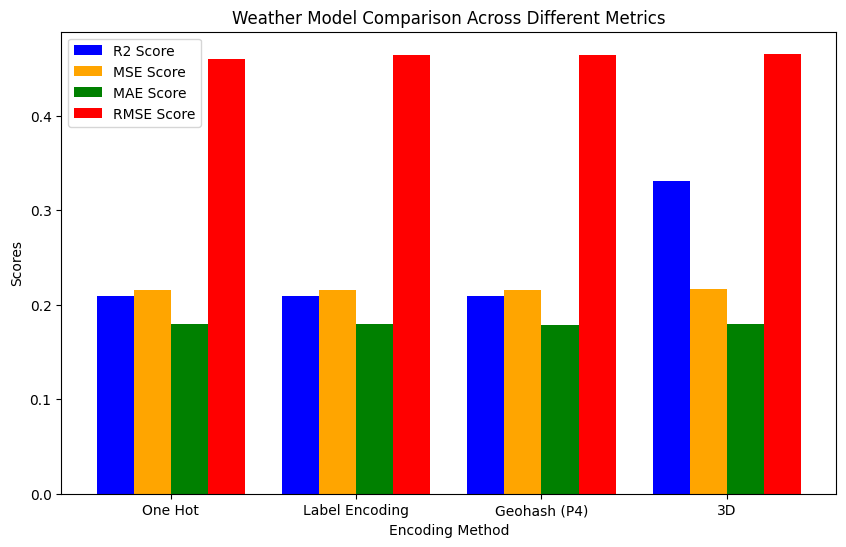

In [ ]:
# Define categories and encoding methods
weather_categories = ["One Hot", "Label Encoding", "Geohash (P4)", "3D"]
precision_weather = 4  # Using precision 4 for weather

# Extract weather-specific scores
weather_scores = {
    "R2 Score": [
        weather_r2_hot_vect,
        weather_r2_label_encoding,
        results_weather_geohash[precision_weather]["R2"],
        weather_r2_3d
    ],
    "MSE Score": [
        weather_mse_hot_vect,
        weather_mse_label_encoding,
        results_weather_geohash[precision_weather]["MSE"],
        weather_mse_3d
    ],
    "MAE Score": [
        weather_mae_hot_vect,
        weather_mae_label_encoding,
        results_weather_geohash[precision_weather]["MAE"],
        weather_mae_3d
    ],
    "RMSE Score": [
        weather_rmse_hot_vect,
        weather_rmse_label_encoding,
        results_weather_geohash[precision_weather]["RMSE"],
        weather_rmse_3d
    ]
}

# Plot all weather metrics in one grouped bar chart
x = np.arange(len(weather_categories))  # X-axis positions
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Define colors for different metrics
colors = ['blue', 'orange', 'green', 'red']

# Plot each metric with different color bars
for i, (metric, scores) in enumerate(weather_scores.items()):
    ax.bar(x + i * width, scores, width, label=metric, color=colors[i])

# Labels and title
ax.set_xlabel("Encoding Method")
ax.set_ylabel("Scores")
ax.set_title("Weather Model Comparison Across Different Metrics")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(weather_categories)
ax.legend()

# Show plot
plt.show()


One-Hot Encoding, Label Encoding, and Geohash (P4) show similar performance across all metrics while **3D Encoding stands out with the highest R² Score**, indicating that it performes better than the other methods.

3D encoding is best for worldwide weather prediction because it captures spatial relationships more accurately by incorporating latitude, longitude, and a third spatial dimension, allowing the model to better represent global weather patterns and geographic variations.

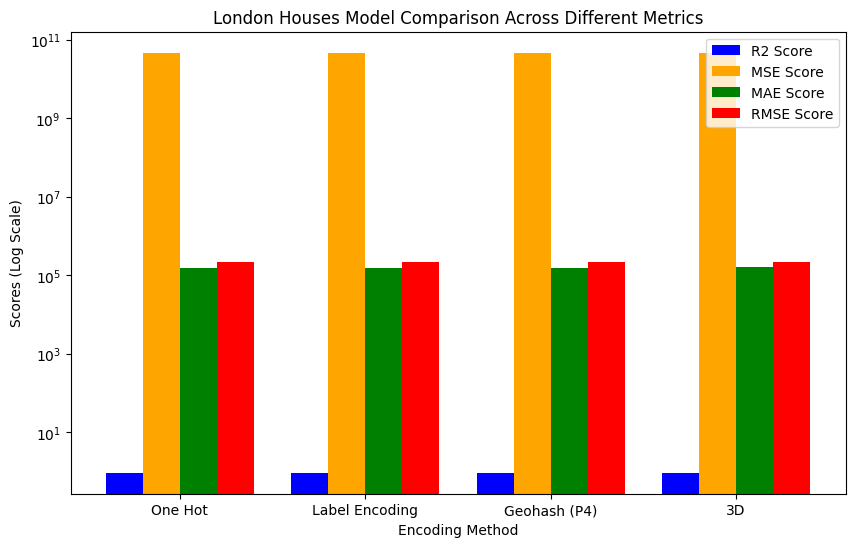

In [ ]:
# Define categories and encoding methods for London Houses
london_categories = ["One Hot", "Label Encoding", "Geohash (P4)", "3D"]
precision_london = 4  # Using precision 4 for London Houses

# Extract London Houses-specific scores
london_scores = {
    "R2 Score": [
        london_houses_r2_hot_vect,
        london_houses_r2_label_encoding,
        results_london[precision_london]["R2"],
        r2_london_3d
    ],
    "MSE Score": [
        london_houses_mse_hot_vect,
        london_houses_mse_label_encoding,
        results_london[precision_london]["MSE"],
        mse_london_3d
    ],
    "MAE Score": [
        london_houses_mae_hot_vect,
        london_houses_mae_label_encoding,
        results_london[precision_london]["MAE"],
        mae_london_3d
    ],
    "RMSE Score": [
        london_houses_rmse_hot_vect,
        london_houses_rmse_label_encoding,
        results_london[precision_london]["RMSE"],
        rmse_london_3d
    ]
}

# Plot all London Houses metrics in one grouped bar chart
x = np.arange(len(london_categories))  # X-axis positions
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Define colors for different metrics
colors = ['blue', 'orange', 'green', 'red']

# Plot each metric with different color bars
for i, (metric, scores) in enumerate(london_scores.items()):
    ax.bar(x + i * width, scores, width, label=metric, color=colors[i])

# Labels and title
ax.set_xlabel("Encoding Method")
ax.set_ylabel("Scores (Log Scale)")
ax.set_title("London Houses Model Comparison Across Different Metrics")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(london_categories)
ax.legend()

# Apply log scale to better visualize different magnitudes
ax.set_yscale('log')

# Show plot
plt.show()


All encoding methods perform similarly, suggesting that the model effectively captures most of the variance in London house prices. However, Geohash and 3D encoding do not provide significant improvements over One-Hot and Label Encoding, likely because property prices are highly localized to neighborhoods. Since neighborhoods already define price regions, categorical encoding methods (One-Hot and Label Encoding) are sufficient, while spatial encodings like Geohash and 3D may introduce unnecessary complexity without adding much predictive value.

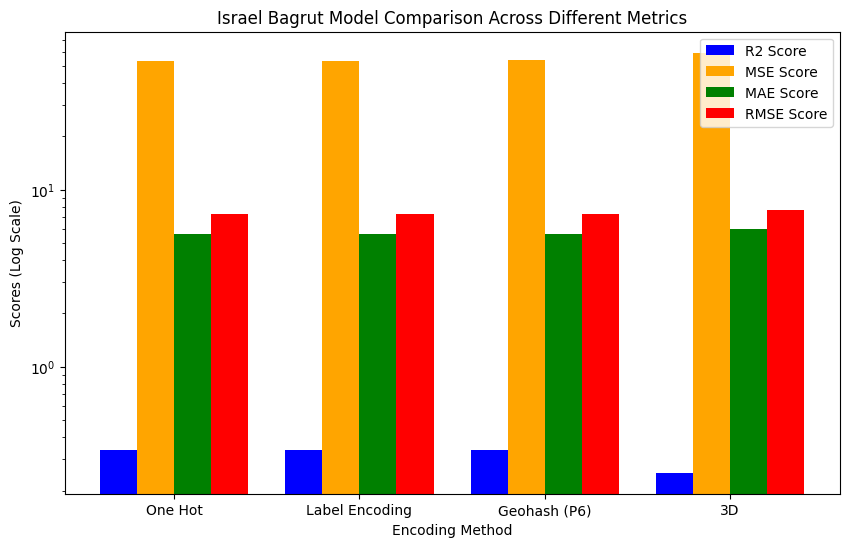

In [ ]:
# Define categories and encoding methods for Israel Bagrut
bagrut_categories = ["One Hot", "Label Encoding", "Geohash (P6)", "3D"]
precision_bagrut = 6  # Using precision 6 for Israel Bagrut

# Extract Israel Bagrut-specific scores
bagrut_scores = {
    "R2 Score": [
        israel_bagrut_r2_hot_vect,
        israel_bagrut_r2_label_encoding,
        results_bagrut[precision_bagrut]["R2"],
        israel_bagrut_3d_r2
    ],
    "MSE Score": [
        israel_bagrut_mse_hot_vect,
        israel_bagrut_mse_label_encoding,
        results_bagrut[precision_bagrut]["MSE"],
        israel_bagrut_3d_mse
    ],
    "MAE Score": [
        israel_bagrut_mae_hot_vect,
        israel_bagrut_mae_label_encoding,
        results_bagrut[precision_bagrut]["MAE"],
        israel_bagrut_3d_mae
    ],
    "RMSE Score": [
        israel_bagrut_rmse_hot_vect,
        israel_bagrut_rmse_label_encoding,
        results_bagrut[precision_bagrut]["RMSE"],
        israel_bagrut_3d_rmse
    ]
}

# Plot all Israel Bagrut metrics in one grouped bar chart
x = np.arange(len(bagrut_categories))  # X-axis positions
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Define colors for different metrics
colors = ['blue', 'orange', 'green', 'red']

# Plot each metric with different color bars
for i, (metric, scores) in enumerate(bagrut_scores.items()):
    ax.bar(x + i * width, scores, width, label=metric, color=colors[i])

# Labels and title
ax.set_xlabel("Encoding Method")
ax.set_ylabel("Scores (Log Scale)")
ax.set_title("Israel Bagrut Model Comparison Across Different Metrics")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(bagrut_categories)
ax.legend()

# Apply log scale to better visualize different magnitudes
ax.set_yscale('log')

# Show plot
plt.show()


All encoding methods perform similarly, suggesting that the model effectively captures most of the variance in student performance.
Geohash and 3D encoding perform slightly worse than One-Hot and Label Encoding, as indicated by lower R² scores and slightly higher error metrics. Educational performance is primarily influenced by school-specific factors, such as funding, teacher quality, and curriculum, rather than pure spatial location.

One-hot encoding works well because it directly assigns a unique representation to each school or city, preserving school-specific influences without introducing unnecessary spatial generalization.

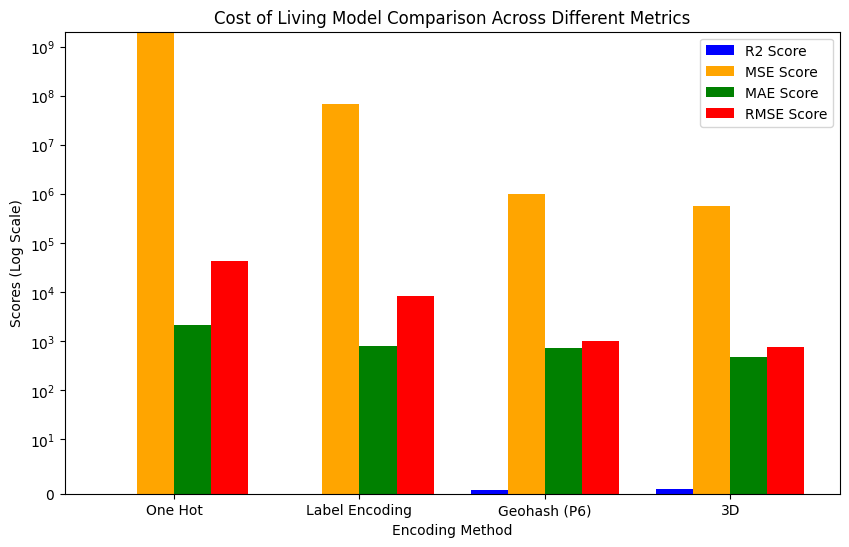

In [ ]:


# Define categories and encoding methods for Cost of Living
cost_categories = ["One Hot", "Label Encoding", "Geohash (P6)", "3D"]
precision_cost = 6  # Using precision 6 for Cost of Living

# Extract Cost of Living-specific scores
cost_scores = {
    "R2 Score": [
        r2_cost_hot_vect,
        r2_label_cost,
        results_geohash[precision_cost]["R2"],
        r2_cost_of_living_3d
    ],
    "MSE Score": [
        mse_cost_hot_vect,
        mse_label_cost,
        results_geohash[precision_cost]["MSE"],
        mse_cost_of_living_3d
    ],
    "MAE Score": [
        mae_cost_hot_vect,
        mae_label_cost,
        results_geohash[precision_cost]["MAE"],
        mae_cost_of_living_3d
    ],
    "RMSE Score": [
        rmse_cost_hot_vect,
        rmse_label_cost,
        results_geohash[precision_cost]["RMSE"],
        rmse_cost_of_living_3d
    ]
}

# Plot all Cost of Living metrics in one grouped bar chart
x = np.arange(len(cost_categories))  # X-axis positions
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Define colors for different metrics
colors = ['blue', 'orange', 'green', 'red']

# Plot each metric with different color bars
for i, (metric, scores) in enumerate(cost_scores.items()):
    ax.bar(x + i * width, scores, width, label=metric, color=colors[i])

# Labels and title
ax.set_xlabel("Encoding Method")
ax.set_ylabel("Scores (Log Scale)")
ax.set_title("Cost of Living Model Comparison Across Different Metrics")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(cost_categories)
ax.legend()

# Apply log scale to better visualize different magnitudes
ax.set_yscale('symlog', linthresh=10)

# Show plot
plt.show()


The graph compares different encoding methods for predicting cost of living, showing that Geohash and 3D encoding outperform One-Hot and Label Encoding by better capturing regional price variations. Since cost of living is highly location-dependent, spatial encodings are more effective, while city-based categorical encodings fail to preserve meaningful geographic relationships.

## 📌 6. **Conclusions**

***Research Summary: Location Feature Integration***  

In our research, we explored different methods for integrating location features across diverse datasets. Our findings indicate that there is no universal approach—optimal performance depends on the dataset’s scale and structure.  

The **3D coordinate system** proved particularly advantageous for **global datasets**, such as weather, where spatial continuity is crucial. This highlights **3D encoding** as a powerful tool for **worldwide applications**, capturing complex geographic relationships more effectively than other methods.  

For **localized datasets**, however, neither **3D coordinates nor geohash** provided significant improvements. In cases where location functions more as a **categorical variable**—such as **neighborhoods in London**—**one-hot encoding** or **label encoding** may be more suitable, as they emphasize distinct regional attributes rather than spatial proximity.  

While **geohash** can effectively model **proximity-based patterns**, its advantages **diminish in smaller, well-defined areas** where traditional categorical encoding methods are often sufficient.
